In [1]:
%matplotlib inline              
import numpy as np 
import pandas as pd
 
stu_adm = pd.read_csv('ds/student_admission105.csv', encoding="utf-8", dtype=str) 
uname = pd.read_csv('ds/univ_105.csv', encoding="utf-8", dtype=str)
 
all_depid = stu_adm['department_id'].unique() 
all_stuid = stu_adm['student_id'].unique()
 
ndepid = all_depid.shape[0] 
nstuid = all_stuid.shape[0] 
print("There are %d students and %d departments in total." % (nstuid, ndepid))
 
#stu_adm.head(10)
#print(uname.shape[0])

There are 62336 students and 1934 departments in total.


In [2]:
#construct the department-student matrix (i.e. array). 
dep_stu = np.zeros((ndepid, nstuid))
rowname = all_depid.copy()
 
depid_seq_map = dict() 
for i in range(ndepid):    
    depid_seq_map[all_depid[i]] = i

stuid_seq_map = dict() 
for i in range(nstuid):    
    stuid_seq_map[all_stuid[i]] = i
#print(depid_seq_map.items())

for cindex, row in stu_adm.iterrows():    
    #print(cindex, row)    
    dep_seq = depid_seq_map[row['department_id']]    
    stu_seq = stuid_seq_map[row['student_id']]    
    #print(dep_seq, stu_seq)    
    dep_stu[dep_seq, stu_seq] = 1


#Remove very small departments.
min_stu_per_dep = 10 
min_apply_dep_per_stu = 2
 
#remove small departments and single-application students. 
dep_apply_sum = np.sum(dep_stu, axis = 1) 
keeprow = dep_apply_sum >= min_stu_per_dep 
rowname = rowname[keeprow] 
dep_stu2 = dep_stu[keeprow,:] 
stu_apply_sum = np.sum(dep_stu2, axis = 0) 
dep_stu2 = dep_stu2[:, stu_apply_sum >= min_apply_dep_per_stu]
 
#another run of filtering 
dep_apply_sum = np.sum(dep_stu2, axis = 1) 
dep_stu2 = dep_stu2[dep_apply_sum >= min_stu_per_dep,:] 
rowname = rowname[dep_apply_sum >= min_stu_per_dep] 
stu_apply_sum = np.sum(dep_stu2, axis = 0) 
dep_stu2 = dep_stu2[:, stu_apply_sum >= min_apply_dep_per_stu]
 
#third run of filtering 
dep_apply_sum = np.sum(dep_stu2, axis = 1) 
dep_stu2 = dep_stu2[dep_apply_sum >= min_stu_per_dep,:] 
rowname = rowname[dep_apply_sum >= min_stu_per_dep]
stu_apply_sum = np.sum(dep_stu2, axis = 0) 
dep_stu2 = dep_stu2[:, stu_apply_sum >= min_apply_dep_per_stu]

#check to make sure the two conditions are satisfied. 
dep_apply_sum = np.sum(dep_stu2, axis = 1) 
print("Number of department too small:", np.sum(dep_apply_sum < min_stu_per_dep)) 
stu_apply_sum = np.sum(dep_stu2, axis = 0) 
print("Number of students applying only one department:", np.sum(stu_apply_sum <min_apply_dep_per_stu))
 

Number of department too small: 0
Number of students applying only one department: 0


In [3]:
num_dep, num_stu = dep_stu2.shape
print("In final dataset, there are", num_dep, "academic departments and", num_stu, "student applicants.")

In final dataset, there are 1894 academic departments and 48289 student applicants.


In [4]:
uname['depname'] = uname.school_name_abbr + uname.department_name_abbr
uname2 = uname[['department_id', 'depname', 'category_name']].copy()

#this is for later use, to color data points. 
category_id, category_levels = pd.factorize(uname2.category_name,sort='TRUE')
print(category_id)

uname2['category_id'] = category_id
#print(uname2.head(10))

#create a data frame for column name
colname_df = pd.DataFrame({'department_id': rowname})
print(uname2.shape[0])
colname_df = colname_df.merge(uname2, how = "left", on="department_id")
#colname_df.shape[0]
#colname_df.to_csv('ds/color107_merged.csv', sep=',')

[ 3  7  7 ... -1 -1 -1]
2023


In [5]:
from matplotlib.font_manager import FontProperties
from matplotlib import pyplot as plt

category_df = colname_df[['category_name', 'category_id']].copy()
category_df = category_df.drop_duplicates().sort_values(['category_id'])
print(category_df)

     category_name  category_id
89              其他            0
45        商業、管理及法律            1
28        工程、製造及營建            2
60              教育            3
155             服務            4
5    社會科學、新聞學及圖書資訊            5
8       自然科學、數學及統計            6
0            藝術及人文            7
50          資訊通訊科技            8
33     農業、林業、漁業及獸醫            9
20       醫藥衛生及社會福利           10


### plot result:

In [6]:
#first define an utility function for plotting result
from matplotlib.font_manager import FontProperties
from matplotlib import pyplot as plt

ChineseFont2 = FontProperties(fname='C:\\Windows\\Fonts\\mingliu.ttc')

def plot_result(x, y, record_cluster, name, colorid, addname = True, fontsize = 6, markersize = 20,
                dpi = 200, datascale = 1.0, outfn = 'univdep.png', title = None):
    
    x = x * datascale
    y = y * datascale
    record_cluster = record_cluster * datascale
    
    fig, ax = plt.subplots(dpi = dpi)
    ax.invert_xaxis()
    
    if title != None:
        ax.set_title(title)
    ax.scatter(x, y, s = markersize, color = colorid, alpha = 0.8)


    nameshift = np.sqrt(markersize) / 2
    if addname == True:
        for i, txt in enumerate(name):
            #txt = txt + str(record_cluster[i])
            ax.annotate(txt, (x[i] + nameshift -0.7, y[i]), size = fontsize, color = 'gray', fontproperties=ChineseFont2)
    plt.show()
    #plt.savefig('univdep.svg')
    
    #plt.savefig(outfn)
    #plt.close(fig)


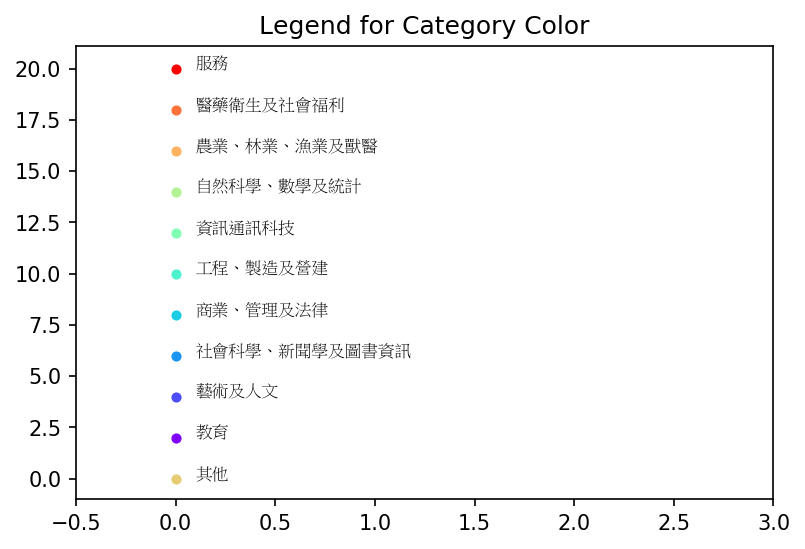

1894

In [7]:
import matplotlib.pyplot as plt 

ncategory = category_df.shape[0]

#colors = plt.cm.rainbow(np.linspace(0,1, ncategory))
x = [0.7, 0.3, 0.4, 0, 1 , 0.2, 0.6, 0.1, 0.5 ,0.75 , 0.85]
colors = plt.cm.rainbow(x)

fig, ax = plt.subplots(dpi = 150)
ax.set_title("Legend for Category Color")
ax.set_xlim([-0.5, 3])
show_order = [0,3,7,5,1,2,8,6,9,10,4]
j = 0
for i in show_order:
    #print(category_df.category_name.values[i]  )
    thecolor = colors[category_df.category_id.values[i]]
    name = category_df.category_name.values[i]        ###  
    x = 0
    y = 2 * j    
    ax.scatter(x, y, s = 15, color = thecolor)    
    ax.annotate(name, (x+0.1, y), fontsize=8,  fontproperties=ChineseFont2)
    j+=1
#plt.savefig("plot_legend.png")
plt.show()


#define department colors. 
dep_color = colors[colname_df.category_id.values]
#print(dep_color)
dep_color.shape[0]

### t-SNE Visualization:

In [8]:
from sklearn.manifold import TSNE
np.random.seed(1001)

tsne_jac = TSNE(n_components=2, metric='jaccard', verbose=1, perplexity=10, learning_rate=15)
tsne_jac_dep = tsne_jac.fit_transform(dep_stu2)
#plot_result(tsne_jac_dep[:,0], tsne_jac_dep[:,1], colname_df['depname'], dep_color, dpi = 150, addname = False, title = "t-SNE with Jaccard metric")


[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 1894 samples in 7.641s...
[t-SNE] Computed neighbors for 1894 samples in 513.752s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1894
[t-SNE] Computed conditional probabilities for sample 1894 / 1894
[t-SNE] Mean sigma: 0.138987
[t-SNE] KL divergence after 250 iterations with early exaggeration: 84.810196
[t-SNE] KL divergence after 1000 iterations: 1.329634


#### unclutter

In [9]:
#original version
def unclutter(tsne_dep2, threshold = 1.1, newdistrate = 1.4, xaxisrate = 0.3, linkcomp = 'average'):
    #try do de-clutter.
    from scipy.cluster.hierarchy import dendrogram, linkage, fcluster

    tsne_dep2a = tsne_dep2.copy()
    #threshold = 1.1
    newdist = (threshold + 0.01) / newdistrate
    #construct a weighted version
    tmp_tsne = tsne_dep2a.copy()
    tmp_tsne[:,0] = tmp_tsne[:,0] * xaxisrate   #aggresively cluster x-axis neighbors
    linked = linkage(tmp_tsne, linkcomp)
    clus1 = fcluster(linked, t = threshold, criterion = 'distance')

    ncluster = 0
    record_cluster = np.zeros((1894))
    for clus_id in range(1,np.max(clus1)+1 ):  #np.max(clus1)+1
        #clus_id = 1
        tmpind = clus1 == clus_id
        record_cluster[tmpind] = clus_id #--------------------------------------
        
        npoint = np.sum(tmpind)
        if npoint > 1:
            ncluster += 1
            x0 = tsne_dep2a[tmpind,:]
            center = np.mean(x0, axis = 0)  

            direction = np.zeros((npoint, 2))
            for i in range(npoint):
                direction[i,:] = np.array([0.0, (i - npoint/2) * newdist])

            newx0 = center + direction
        
            direction = np.zeros((npoint, 2))        
            x0 = tsne_dep2a[tmpind,:]
            for i in range(npoint):
                direction[i,:] = np.array([0.0, npoint-0.8*(i-1) ])  #(i-npoint/2) * newdist  ------------------

            newx0 = center + direction 
            
        else:                            #npoint == 1
            x0 = tsne_dep2a[tmpind,:]
            newx0 = np.mean(x0, axis = 0)
            #print(clus_id)
            
            
            
        #-----adjust the point (the whole cluster) position-----------------------------------------------------    



        if clus_id ==1:
            newx0 = newx0 + [3, 0.5]
        elif clus_id ==2:
            newx0 = newx0 + [1, 0]
        elif clus_id ==4:
            newx0 = newx0 + [2, 0]
        elif clus_id ==6:
            newx0 = newx0 + [0, 0.86]
        elif clus_id ==7:
            newx0 = newx0 + [-0.5, 0]
        elif clus_id ==10:
            newx0 = newx0 + [0.5, 0]
        elif clus_id ==17:
            newx0 = newx0 + [-1, 0]
        elif clus_id ==20:
            newx0 = newx0 + [1.5, 0.86]
        elif clus_id ==24:
            newx0 = newx0 + [-1, -0.3]
        elif clus_id ==26:
            newx0 = newx0 + [0, 3]
        elif clus_id ==27:
            newx0 = newx0 + [1.5,-0.5]
        elif clus_id ==29:
            newx0 = newx0 + [1.5, -0.1]
        elif clus_id ==34:
            newx0 = newx0 + [-0.5, 0]
        elif clus_id ==38:
            newx0 = newx0 + [0,2.2]
        elif clus_id ==43:
            newx0 = newx0 + [-1, 0]
        elif clus_id ==46:
            newx0 = newx0 + [-1, -0.8]
        elif clus_id ==49:
            newx0 = newx0 + [0, 0.86]
        elif clus_id ==55:
            newx0 = newx0 + [0, -0.86]
        elif clus_id ==56:
            newx0 = newx0 + [0, -0.86]
        elif clus_id ==58:
            newx0 = newx0 + [0, -0.2]
        elif clus_id ==60:
            newx0 = newx0 + [0, -0.2]
        elif clus_id ==63:
            newx0 = newx0 + [0, 1.72]
        elif clus_id ==64:
            newx0 = newx0 + [0, 1.72]
        elif clus_id ==67:
            newx0 = newx0 + [0, -0.5]
        elif clus_id ==72:
            newx0 = newx0 + [1, 0]
        elif clus_id ==78:
            newx0 = newx0 + [0, -0.86]
        elif clus_id ==80:
            newx0 = newx0 + [0, 0.5]
        elif clus_id ==81:
            newx0 = newx0 + [0, 1]
        elif clus_id ==86:
            newx0 = newx0 + [-2, 0]
        elif clus_id ==89:
            newx0 = newx0 + [-0.5, 0.86]
        elif clus_id ==93:
            newx0 = newx0 + [2, 0]
        elif clus_id ==94:
            newx0 = newx0 + [0, 1.72]
        elif clus_id ==97:
            newx0 = newx0 + [0,0.2]
        elif clus_id ==100:
            newx0 = newx0 + [-2, 0]
        elif clus_id ==101:
            newx0 = newx0 + [0.5, 0]
        elif clus_id ==104:
            newx0 = newx0 + [0, -0.86]
        elif clus_id ==107:
            newx0 = newx0 + [1, 0]
        elif clus_id ==110:
            newx0 = newx0 + [-1, 0.86]
        elif clus_id ==114:
            newx0 = newx0 + [0,-0.4]
        elif clus_id ==115:
            newx0 = newx0 + [0, 0.86]
        elif clus_id ==116:
            newx0 = newx0 + [0, -0.86]
        elif clus_id ==119:
            newx0 = newx0 + [1.2, 0]
        elif clus_id ==124:
            newx0 = newx0 + [0, -1.4]
        elif clus_id ==125:
            newx0 = newx0 + [1.5, -3.4]
        elif clus_id ==127:
            newx0 = newx0 + [1, 0]
        elif clus_id ==128:
            newx0 = newx0 + [0, -0.4]
        elif clus_id ==130:
            newx0 = newx0 + [0, -0.86]
        elif clus_id ==131:
            newx0 = newx0 + [0, -1.72]
        elif clus_id ==133:
            newx0 = newx0 + [1, 0.2]
        elif clus_id ==140:
            newx0 = newx0 + [0, -1.72]
        elif clus_id ==142:
            newx0 = newx0 + [-1, 0.86]
        elif clus_id ==145:
            newx0 = newx0 + [-1, 0]
        elif clus_id ==147:
            newx0 = newx0 + [0, -1.5]
        elif clus_id ==148:
            newx0 = newx0 + [0, -0.86]
        elif clus_id ==149:
            newx0 = newx0 + [0.5, 0]
        elif clus_id ==151:
            newx0 = newx0 + [1.5, 0]
        elif clus_id ==154:
            newx0 = newx0 + [1, 0]
        elif clus_id ==155:
            newx0 = newx0 + [0, -0.86]
        elif clus_id ==159:
            newx0 = newx0 + [1, 0]
        elif clus_id ==160:
            newx0 = newx0 + [-0.5, 0]
        elif clus_id ==163:
            newx0 = newx0 + [0,-0.9]
        elif clus_id ==166:
            newx0 = newx0 + [0, 0.6]
        elif clus_id ==168:
            newx0 = newx0 + [0, -0.4]
        elif clus_id ==169:
            newx0 = newx0 + [0, 0.86]
        elif clus_id ==170:
            newx0 = newx0 + [1, 0]
        elif clus_id ==171:
            newx0 = newx0 + [0.5, -2.6]    
        elif clus_id ==172:
            newx0 = newx0 + [0, -0.5]
        elif clus_id ==174:
            newx0 = newx0 + [0, 1.72]
        elif clus_id ==175:
            newx0 = newx0 + [0, -1.6]
        elif clus_id ==177:
            newx0 = newx0 + [0,-0.86]
        elif clus_id ==178:
            newx0 = newx0 + [-3, -2.3]
        elif clus_id ==179:
            newx0 = newx0 + [0, -1.7]
        elif clus_id ==182:
            newx0 = newx0 + [-0.5, 0]
        elif clus_id ==183:
            newx0 = newx0 + [-3, 0]
        elif clus_id ==184:
            newx0 = newx0 + [0, -1.4]
        elif clus_id ==186:
            newx0 = newx0 + [0, -1]
        elif clus_id ==187:
            newx0 = newx0 + [-0.5, -0.2]
        elif clus_id ==190:
            newx0 = newx0 + [0,-0.4]
        elif clus_id ==194:
            newx0 = newx0 + [2.5, 0]
        elif clus_id ==195:
            newx0 = newx0 + [-0.5, 0]
        elif clus_id ==197:
            newx0 = newx0 + [0.5,0]
        elif clus_id ==198:
            newx0 = newx0 + [0, 1.72]
        elif clus_id ==200:
            newx0 = newx0 + [-1.5, 0]
        elif clus_id ==204:
            newx0 = newx0 + [-0.5, 0]
        elif clus_id ==205:
            newx0 = newx0 + [0,0.1]
        elif clus_id ==206:
            newx0 = newx0 + [1, -0.2]
        elif clus_id ==208:
            newx0 = newx0 + [-0.5, -0.7]
        elif clus_id ==209:
            newx0 = newx0 + [0.5, 0.86]
        elif clus_id ==210:
            newx0 = newx0 + [0, -0.8]
        elif clus_id ==212:
            newx0 = newx0 + [0, -1.5]
        elif clus_id ==213:
            newx0 = newx0 + [-0.5, 0]
        elif clus_id ==214:
            newx0 = newx0 + [0, 1.72]
        elif clus_id ==216:
            newx0 = newx0 + [0, -0.2]
        elif clus_id ==218:
            newx0 = newx0 + [0, 2]
        elif clus_id ==220:
            newx0 = newx0 + [0, -1]
        elif clus_id ==224:
            newx0 = newx0 + [0, 0.4]
        elif clus_id ==231:
            newx0 = newx0 + [-1, 0]
        elif clus_id ==232:
            newx0 = newx0 + [0, 0.5]
        elif clus_id ==234:
            newx0 = newx0 + [1.5, 0]
        elif clus_id ==239:
            newx0 = newx0 + [-0.5, 0]
        elif clus_id ==242:
            newx0 = newx0 + [2, -0.86]
        elif clus_id ==244:
            newx0 = newx0 + [0,-0.2]
        elif clus_id ==246:
            newx0 = newx0 + [0, 0.43]
        elif clus_id ==249:
            newx0 = newx0 + [0,-0.86]
        elif clus_id ==252:
            newx0 = newx0 + [0.5, 0]
        elif clus_id ==258:
            newx0 = newx0 + [-0.5, 1.6]
        elif clus_id ==259:
            newx0 = newx0 + [1.5, -0.7]
        elif clus_id ==260:
            newx0 = newx0 + [-1, 1]
        elif clus_id ==261:
            newx0 = newx0 + [-0.5, -0.2]
        elif clus_id ==263:
            newx0 = newx0 + [1, 0]
        elif clus_id ==265:
            newx0 = newx0 + [1, 0]
        elif clus_id ==267:
            newx0 = newx0 + [-0.5, -2.8]
        elif clus_id ==268:
            newx0 = newx0 + [1.5, 0]
        elif clus_id ==270:
            newx0 = newx0 + [-1, 1]
        elif clus_id ==274:
            newx0 = newx0 + [-1, 0]
        elif clus_id ==275:
            newx0 = newx0 + [-1.5, -1.7]
        elif clus_id ==276:
            newx0 = newx0 + [-1, 0]
        elif clus_id ==277:
            newx0 = newx0 + [-0.4, 0]
        elif clus_id ==279:
            newx0 = newx0 + [-2, 0]
        elif clus_id ==280:
            newx0 = newx0 + [1, -0.86]
        elif clus_id ==282:
            newx0 = newx0 + [1.5, -1.3]
        elif clus_id ==285:
            newx0 = newx0 + [-2.5, 0]
        elif clus_id ==287:
            newx0 = newx0 + [0, -0.86]
        elif clus_id ==291:
            newx0 = newx0 + [0, -0.2]
        elif clus_id ==292:
            newx0 = newx0 + [0, -0.86]
        elif clus_id ==295:
            newx0 = newx0 + [-1, 0.43]
        elif clus_id ==296:
            newx0 = newx0 + [1.5, 0]
        elif clus_id ==298:
            newx0 = newx0 + [-1, 0.86]
        elif clus_id ==299:
            newx0 = newx0 + [0, -1.72]
        elif clus_id ==300:
            newx0 = newx0 + [0,0.2]
        elif clus_id ==305:
            newx0 = newx0 + [2, -0.86]
        elif clus_id ==307:
            newx0 = newx0 + [0, -3.4]
        elif clus_id ==309:
            newx0 = newx0 + [0, 1.72]
        elif clus_id ==312:
            newx0 = newx0 + [0, 0.1]
        elif clus_id ==313:
            newx0 = newx0 + [0, 0.5]
        elif clus_id ==316:
            newx0 = newx0 + [-1.5, 0]
        elif clus_id ==317:
            newx0 = newx0 + [0, 0.86]
        elif clus_id ==318:
            newx0 = newx0 + [0, -0.86]
        elif clus_id ==320:
            newx0 = newx0 + [0, 0.43]
        elif clus_id ==323:
            newx0 = newx0 + [0, -0.86]
        elif clus_id ==329:
            newx0 = newx0 + [4.2, 1.9]
        elif clus_id ==330:
            newx0 = newx0 + [2, 0]
        elif clus_id ==335:
            newx0 = newx0 + [-1,0]
        elif clus_id ==336:
            newx0 = newx0 + [2, 0]
        elif clus_id ==337:
            newx0 = newx0 + [-2, 0]
        elif clus_id ==340:
            newx0 = newx0 + [-0.5, 0.3]
        elif clus_id ==341:
            newx0 = newx0 + [-1, -0.86]
        elif clus_id ==342:
            newx0 = newx0 + [-1.5, 0]
        elif clus_id ==349:
            newx0 = newx0 + [-2, 0]
        elif clus_id ==351:
            newx0 = newx0 + [0, 1.72]
        elif clus_id ==353:
            newx0 = newx0 + [0.5, 0]
        elif clus_id ==355:
            newx0 = newx0 + [-0.5, 0]
        elif clus_id ==357:
            newx0 = newx0 + [0.5, 0]
        elif clus_id ==360:
            newx0 = newx0 + [3, 0.8]
        elif clus_id ==365:
            newx0 = newx0 + [-2, 0]
        elif clus_id ==366:
            newx0 = newx0 + [-0.5, 1.72]
        elif clus_id ==367:
            newx0 = newx0 + [0, 1.8]
        elif clus_id ==370:
            newx0 = newx0 + [0, 1.7]
        elif clus_id ==371:
            newx0 = newx0 + [0.5, 0]
        elif clus_id ==372:
            newx0 = newx0 + [0.5,0.2]           
        elif clus_id ==374:
            newx0 = newx0 + [0.5, -0.86]
        elif clus_id ==375:
            newx0 = newx0 + [2, -0.86]
        elif clus_id ==376:
            newx0 = newx0 + [0,0.86]           
        elif clus_id ==377:
            newx0 = newx0 + [0,-2.6]
        elif clus_id ==378:
            newx0 = newx0 + [0.5, 0]
        elif clus_id ==379:
            newx0 = newx0 + [0, -0.86]
        elif clus_id ==380:
            newx0 = newx0 + [0, -0.43]
        elif clus_id ==383:
            newx0 = newx0 + [0, 0.86]
        elif clus_id ==384:
            newx0 = newx0 + [1, 0]
        elif clus_id ==386:
            newx0 = newx0 + [0, 1.3]
        elif clus_id ==387:
            newx0 = newx0 + [0, -0.2]
        elif clus_id ==388:
            newx0 = newx0 + [0, -0.86]
        elif clus_id ==389:
            newx0 = newx0 + [0, -0.86]
        elif clus_id ==390:
            newx0 = newx0 + [1,-0.86]
        elif clus_id ==391:
            newx0 = newx0 + [0, 0.3]
        elif clus_id ==396:
            newx0 = newx0 + [0, -0.43]
        elif clus_id ==397:
            newx0 = newx0 + [1.5, -2]
        elif clus_id ==398:
            newx0 = newx0 + [0.5, 0]
        elif clus_id ==399:
            newx0 = newx0 + [-1, 0]
        elif clus_id ==401:
            newx0 = newx0 + [0, 1.3]
        elif clus_id ==402:
            newx0 = newx0 + [-0.8, 0]
        elif clus_id ==410:
            newx0 = newx0 + [0, 0.86]
        elif clus_id ==412:
            newx0 = newx0 + [0, 1.72]
        elif clus_id ==414:
            newx0 = newx0 + [0.7, 0]
        elif clus_id ==415:
            newx0 = newx0 + [1.8, -1.72]
        elif clus_id ==416:
            newx0 = newx0 + [0, -0.86]
        elif clus_id ==418:
            newx0 = newx0 + [0, -1.72]
        elif clus_id ==419:
            newx0 = newx0 + [0, 0.8]
        elif clus_id ==423:
            newx0 = newx0 + [1,0]
        elif clus_id ==428:
            newx0 = newx0 + [-1, 0]
        elif clus_id ==429:
            newx0 = newx0 + [0, -4.73]
        elif clus_id ==431:
            newx0 = newx0 + [0, 0.86]
        elif clus_id ==432:
            newx0 = newx0 + [1, 0]
        elif clus_id ==433:
            newx0 = newx0 + [0, 0.86]
        elif clus_id ==434:
            newx0 = newx0 + [0, 1.82]
        elif clus_id ==435:
            newx0 = newx0 + [0, 1.72]
        elif clus_id ==436:
            newx0 = newx0 + [0, 1.72]
        elif clus_id ==437:
            newx0 = newx0 + [0, 1.46]
        elif clus_id ==438:
            newx0 = newx0 + [0, 1.4]
        elif clus_id ==444:
            newx0 = newx0 + [-1, 0]
        elif clus_id ==450:
            newx0 = newx0 + [0, 0.86]
        elif clus_id ==454:
            newx0 = newx0 + [-1.5, 0]
        elif clus_id ==455:
            newx0 = newx0 + [1, 0]
        elif clus_id ==456:
            newx0 = newx0 + [0, -0.2]
        elif clus_id ==457:
            newx0 = newx0 + [0,-0.2]
        elif clus_id ==458:
            newx0 = newx0 + [0, -0.86]
        elif clus_id ==459:
            newx0 = newx0 + [0, 4]
        elif clus_id ==461:
            newx0 = newx0 + [0, -0.8]
        elif clus_id ==462:
            newx0 = newx0 + [0.5, -0.2]
        elif clus_id ==463:
            newx0 = newx0 + [0, -0.86]
        elif clus_id ==464:
            newx0 = newx0 + [0.5,-5.1]
        elif clus_id ==465:
            newx0 = newx0 + [-1, 0]
        elif clus_id ==467:
            newx0 = newx0 + [0, 1.72]
        elif clus_id ==468:
            newx0 = newx0 + [-2, 0]
        elif clus_id ==469:
            newx0 = newx0 + [0, -1.9]
        elif clus_id ==470:
            newx0 = newx0 + [0.75,0]
        elif clus_id ==471:
            newx0 = newx0 + [0, -0.86]
        elif clus_id ==473:
            newx0 = newx0 + [0, -1.72]
        elif clus_id ==475:
            newx0 = newx0 + [1, 0.6]
        elif clus_id ==477:
            newx0 = newx0 + [-1.5, 0]
        elif clus_id ==478:
            newx0 = newx0 + [0, -0.4]
        elif clus_id ==479:
            newx0 = newx0 + [-0.5,0]
        elif clus_id ==480:
            newx0 = newx0 + [0.5, 0]
        elif clus_id ==482:
            newx0 = newx0 + [-1, 0]
        elif clus_id ==490:
            newx0 = newx0 + [0, 1.5]
        elif clus_id ==491:
            newx0 = newx0 + [-1, 0]
        elif clus_id ==494:
            newx0 = newx0 + [0, -1.5]
        elif clus_id ==498:
            newx0 = newx0 + [0, 0.43]
        elif clus_id ==499:
            newx0 = newx0 + [0, 0.4]
        elif clus_id ==502:
            newx0 = newx0 + [0.5, -0.86]
        elif clus_id ==504:
            newx0 = newx0 + [-1, 0.5]
        elif clus_id ==506:
            newx0 = newx0 + [1,0.3]
        elif clus_id ==507:
            newx0 = newx0 + [0, -0.86]
        elif clus_id ==510:
            newx0 = newx0 + [-1, -0.6]
        elif clus_id ==512:
            newx0 = newx0 + [0, 0.86]
        elif clus_id ==515:
            newx0 = newx0 + [0, -1.5]
        elif clus_id ==518:
            newx0 = newx0 + [0, 0.4]
        elif clus_id ==524:
            newx0 = newx0 + [0,-0.2]
        elif clus_id ==525:
            newx0 = newx0 + [0, -1.9]
        elif clus_id ==528:
            newx0 = newx0 + [0, 1.4]
        elif clus_id ==529:
            newx0 = newx0 + [0.5, 2.8]
        elif clus_id ==530:
            newx0 = newx0 + [0, -1.72]
        elif clus_id ==531:
            newx0 = newx0 + [0, -0.86]
        elif clus_id ==533:
            newx0 = newx0 + [0, -1.72]
        elif clus_id ==536:
            newx0 = newx0 + [0,0.8]
        elif clus_id ==538:
            newx0 = newx0 + [0, -2.6]
        elif clus_id ==540:
            newx0 = newx0 + [-1.5, 0]
        elif clus_id ==544:
            newx0 = newx0 + [-2, 0]
        elif clus_id ==545:
            newx0 = newx0 + [2.5, -0.86]
        elif clus_id ==549:
            newx0 = newx0 + [-1.5, 0]
        elif clus_id ==553:
            newx0 = newx0 + [-1,0]
        elif clus_id ==554:
            newx0 = newx0 + [-2.5,0]
        elif clus_id ==555:
            newx0 = newx0 + [0, 1.72]
        elif clus_id ==557:
            newx0 = newx0 + [-1.5,0]
        elif clus_id ==558:
            newx0 = newx0 + [2,0]
        elif clus_id ==560:
            newx0 = newx0 + [0, -2.6]
        elif clus_id ==562:
            newx0 = newx0 + [-1,0]
        elif clus_id ==572:
            newx0 = newx0 + [0, 2.6]
        elif clus_id ==573:
            newx0 = newx0 + [0,0.86]
        elif clus_id ==576:
            newx0 = newx0 + [1,0]
        elif clus_id ==581:
            newx0 = newx0 + [0,-1.7]
        elif clus_id ==583:
            newx0 = newx0 + [0, 3]
        elif clus_id ==591:
            newx0 = newx0 + [0,0.2]
        elif clus_id ==593:
            newx0 = newx0 + [2,0]
        elif clus_id ==596:
            newx0 = newx0 + [-0.5,1.3]
        elif clus_id ==600:
            newx0 = newx0 + [-2.2,0]
        elif clus_id ==601:
            newx0 = newx0 + [0.5,0]
        elif clus_id ==602:
            newx0 = newx0 + [3,-1.72]
        elif clus_id ==603:
            newx0 = newx0 + [0,0.2]
        elif clus_id ==605:
            newx0 = newx0 + [1,0]
        elif clus_id ==606:
            newx0 = newx0 + [1.5,0]
        elif clus_id ==607:
            newx0 = newx0 + [-1,0.4]
        elif clus_id ==608:
            newx0 = newx0 + [1,0]
        elif clus_id ==612:
            newx0 = newx0 + [0,1.7]
        elif clus_id ==613:
            newx0 = newx0 + [0,1.7]
        elif clus_id ==614:
            newx0 = newx0 + [0,1.5]
        elif clus_id ==615:
            newx0 = newx0 + [0,1.3]
        elif clus_id ==616:
            newx0 = newx0 + [0,-0.5]
        elif clus_id ==617:
            newx0 = newx0 + [-1,-0.1]
        elif clus_id ==618:
            newx0 = newx0 + [0,1.3]
        elif clus_id ==621:
            newx0 = newx0 + [-0.5,-1.7]
        elif clus_id ==622:
            newx0 = newx0 + [3,0]
        elif clus_id ==625:
            newx0 = newx0 + [0,0.2]
        elif clus_id ==626:
            newx0 = newx0 + [0,-0.86]
        elif clus_id ==628:
            newx0 = newx0 + [-1,0]
        elif clus_id ==629:
            newx0 = newx0 + [0,-3.5]
        elif clus_id ==631:
            newx0 = newx0 + [0.5,0]
        elif clus_id ==634:
            newx0 = newx0 + [-1,0]
        elif clus_id ==635:
            newx0 = newx0 + [-1,1.72]
        elif clus_id ==636:
            newx0 = newx0 + [2.5,-0.86]
        elif clus_id ==641:
            newx0 = newx0 + [0,0.86]
        elif clus_id ==644:
            newx0 = newx0 + [-1,0]
        elif clus_id ==646:
            newx0 = newx0 + [0,1.5]
        elif clus_id ==647:
            newx0 = newx0 + [0.5,0]
        elif clus_id ==648:
            newx0 = newx0 + [0.5,0.86]
        elif clus_id ==656:
            newx0 = newx0 + [5, -0.5]
        elif clus_id ==657:
            newx0 = newx0 + [0, -2.6]
        elif clus_id ==659:
            newx0 = newx0 + [0, -0.2]
        elif clus_id ==663:
            newx0 = newx0 + [2, 0.5]
        elif clus_id ==664:
            newx0 = newx0 + [-1,0]
        elif clus_id ==666:
            newx0 = newx0 + [0,0.3]
        elif clus_id ==674:
            newx0 = newx0 + [0,0.6]
        elif clus_id ==676:
            newx0 = newx0 + [0,-1.12]
        elif clus_id ==677:
            newx0 = newx0 + [0, 2]
        elif clus_id ==678:
            newx0 = newx0 + [0, 3]
        elif clus_id ==679:
            newx0 = newx0 + [-2.5, 0]
        elif clus_id ==681:
            newx0 = newx0 + [0, 2]
        elif clus_id ==683:
            newx0 = newx0 + [0, 1]
        elif clus_id ==685:
            newx0 = newx0 + [0, 1.3]
        elif clus_id ==688:
            newx0 = newx0 + [0, 0.2]
        elif clus_id ==689:
            newx0 = newx0 + [1,0]
        elif clus_id ==690:
            newx0 = newx0 + [0, 0.3]
        elif clus_id ==691:
            newx0 = newx0 + [1.5,0]
        elif clus_id ==692:
            newx0 = newx0 + [-1.5,0]
        elif clus_id ==693:
            newx0 = newx0 + [0,0.86]
        elif clus_id ==695:
            newx0 = newx0 + [0,-2.6]
        elif clus_id ==699:
            newx0 = newx0 + [0.5,0]
        elif clus_id ==700:
            newx0 = newx0 + [-1,0]

        
        
        
        tsne_dep2a[tmpind,:] = newx0

        
    print("unclutter: identified", ncluster, "clusters")
    return(tsne_dep2a,record_cluster)

unclutter: identified 558 clusters


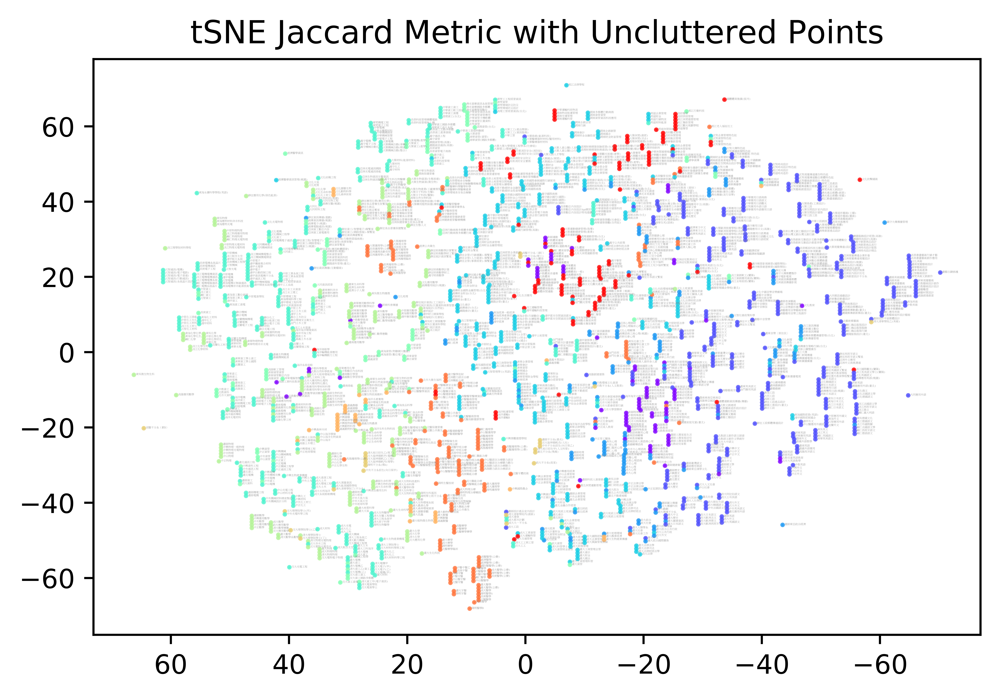

In [11]:
tsne_jac_dep2,record_cluster = unclutter(tsne_jac_dep, linkcomp = 'centroid')

plot_result(tsne_jac_dep2[:,0], tsne_jac_dep2[:,1],record_cluster,
            colname_df['depname'], dep_color, addname = True, fontsize = 1, 
            title = 'tSNE Jaccard Metric with Uncluttered Points',
            markersize= 0.5, dpi = 1400, datascale = 1, outfn = 'univdep_tsne_jac1.png')